In [ ]:
!pip install -U --no-cache-dir gdown --pre

  Attempting uninstall: gdown
    Found existing installation: gdown 4.6.6
    Uninstalling gdown-4.6.6:
      Successfully uninstalled gdown-4.6.6


In [ ]:
!gdown 10y0uP8oH66oUluixejUvQSTGfxDbe6Aw

Downloading...
From (uriginal): https://drive.google.com/uc?id=10y0uP8oH66oUluixejUvQSTGfxDbe6Aw
From (redirected): https://drive.google.com/uc?id=10y0uP8oH66oUluixejUvQSTGfxDbe6Aw&confirm=t&uuid=b85adf71-df58-4de0-80e9-5667ea0e5075
To: /content/dataset.zip
100% 330M/330M [00:16<00:00, 19.6MB/s]


In [ ]:
!unzip /content/dataset.zip

Archive:  /content/dataset.zip
   creating: dataset/
  inflating: dataset/DentalPanoramicXrays.zip  
  inflating: dataset/custom_masks.zip  


In [ ]:
!pip install -U git+https://github.com/albu/albumentations

  Cloning https://github.com/albu/albumentations to /tmp/pip-req-build-4mc83sij
  Running command git clone --filter=blob:none --quiet https://github.com/albu/albumentations /tmp/pip-req-build-4mc83sij
  Resolved https://github.com/albu/albumentations to commit e3b47b3a127f92541cfeb16abbb44a6f8bf79cc8
  Preparing metadata (setup.py) ... done
  Created wheel for albumentations: filename=albumentations-1.3.1-py3-none-any.whl size=125700 sha256=d1fe1238292672df7b1e20c93ff39e511fa7d37d011cf35d7a65c447201a56c0
  Stored in directory: /tmp/pip-ephem-wheel-cache-f5neeldx/wheels/3c/df/16/b3d0d64428c9f25b1ab03989a2e574546d3336647946d31e56
Successfully built albumentations
  Attempting uninstall: albumentations
    Found existing installation: albumentations 1.2.1
    Uninstalling albumentations-1.2.1:
      Successfully uninstalled albumentations-1.2.1


In [ ]:
from zipfile import ZipFile
path = '/content/dataset'

In [ ]:
import os
import numpy as np
from PIL import Image
from zipfile import ZipFile
from natsort import natsorted


def convert_one_channel(img):
    #some images have 3 channels , although they are grayscale image
    if len(img.shape)>2:
        img=img[:,:,0]
        return img
    else:
        return img

def pre_images(resize_shape,path,include_zip):
    if include_zip==True:
        ZipFile(path+"/DentalPanoramicXrays.zip").extractall(path)
        path=path+'/Images/'
    dirs=natsorted(os.listdir(path))
    sizes=np.zeros([len(dirs),2])
    images=img=Image.open(path+dirs[0])
    sizes[0,:]=images.size
    images=(images.resize((resize_shape),Image.ANTIALIAS))
    images=convert_one_channel(np.asarray(images))
    for i in range (1,len(dirs)):
        img=Image.open(path+dirs[i])
        sizes[i,:]=img.size
        img=img.resize((resize_shape),Image.ANTIALIAS)
        img=convert_one_channel(np.asarray(img))
        images=np.concatenate((images,img))
    images=np.reshape(images,(len(dirs),resize_shape[0],resize_shape[1],1))
    return images,sizes

X,X_sizes=pre_images((512,512),path,True)

In [ ]:
import os
import sys
import numpy as np
from PIL import Image
from zipfile import ZipFile
from natsort import natsorted
script_dir=path
default_path=script_dir+'/Original_Masks/'

def convert_one_channel(img):
    #some images have 3 channels , although they are grayscale image
    if len(img.shape)>2:
        img=img[:,:,0]
        return img
    else:
        return img
default_path=script_dir+'/Custom_Masks/'
def pre_splitted_masks(path=default_path):
    ZipFile(path+"/custom_masks.zip").extractall(path+'/Masks/')
    path=path+'/Masks/'
    dirs=natsorted(os.listdir(path))
    masks=img=Image.open(path+dirs[0])
    masks=convert_one_channel(np.asarray(masks))
    for i in range (1,len(dirs)):
        img=Image.open(path+dirs[i])
        img=convert_one_channel(np.asarray(img))
        masks=np.concatenate((masks,img))
    masks=np.reshape(masks,(len(dirs),512,512,1))
    return masks
Y=pre_splitted_masks(path='/content/dataset')

In [ ]:
X=np.float32(X/255)
Y=np.float32(Y/255)
x_train=X[:105,:,:,:]
y_train=Y[:105,:,:,:]
x_test=X[105:,:,:,:]
y_test=Y[105:,:,:,:]

In [ ]:
import cv2

import albumentations as A
aug = A.Compose([
    A.OneOf([A.RandomCrop(width=512, height=512),A.PadIfNeeded(min_height=512, min_width=512, p=0.5)],p=0.4),
    A.RandomBrightnessContrast(brightness_limit=0.25, contrast_limit=0.25,p=0.5),
    A.Compose([A.RandomScale(scale_limit=(-0.15, 0.15), p=1, interpolation=1),
                            A.PadIfNeeded(512, 512, border_mode=cv2.BORDER_CONSTANT),
                            A.Resize(512, 512, cv2.INTER_NEAREST), ],p=0.5),
    A.ShiftScaleRotate (shift_limit=0.325, scale_limit=0.15, rotate_limit=15,border_mode=cv2.BORDER_CONSTANT, p=1),
    A.Rotate(15,p=0.5),
    A.Blur(blur_limit=1, p=0.5),
    A.Downscale(scale_min=0.15, scale_max=0.25,  always_apply=False, p=0.5),
    A.GaussNoise(var_limit=(0.05, 0.1), mean=0, per_channel=True, always_apply=False, p=0.5),
    A.HorizontalFlip(p=0.25),
])

x_train1=np.copy(x_train)
y_train1=np.copy(y_train)
count=0
while(count<4):
  x_aug2=np.copy(x_train1)
  y_aug2=np.copy(y_train1)
  for i in range(len(x_train1)):
    augmented=aug(image=x_train1[i,:,:,:],mask=y_train1[i,:,:,:])
    x_aug2[i,:,:,:]= augmented['image']
    y_aug2[i,:,:,:]= augmented['mask']
  x_train=np.concatenate((x_train,x_aug2))
  y_train=np.concatenate((y_train,y_aug2))
  if count == 9:
    break
  count += 1
del x_aug2
del X
del Y
del y_aug2
del y_train1
del x_train1
del augmented
import random
import matplotlib.pyplot as plt
random_number=random.randint(0,104)
print(random_number)

/usr/local/lib/python3.10/dist-packages/albumentations/augmentations/transforms.py:1692: UserWarning: Using default interpolation INTER_NEAREST, which is sub-optimal.Please specify interpolation mode for downscale and upscale explicitly.For additional information see this PR https://github.com/albumentations-team/albumentations/pull/584
  warnings.warn(


84


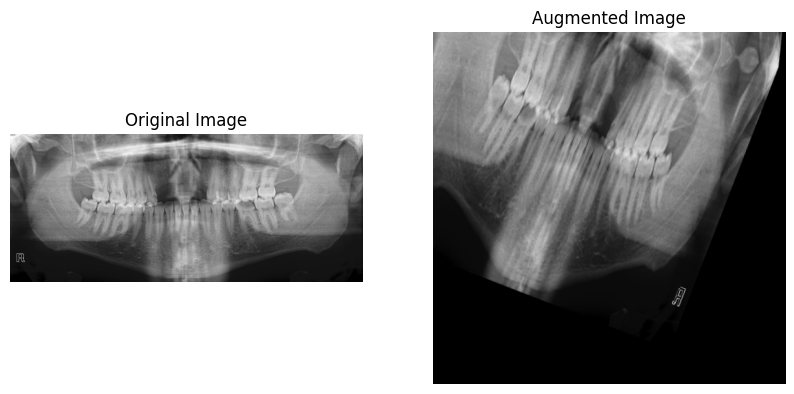

In [ ]:
import cv2
import albumentations as A
import matplotlib.pyplot as plt

# Define the augmentation composition
aug = A.Compose([
    A.OneOf([A.RandomCrop(width=512, height=512), A.PadIfNeeded(min_height=512, min_width=512, p=0.5)], p=0.4),
    A.RandomBrightnessContrast(brightness_limit=0.25, contrast_limit=0.25, p=0.5),
    A.Compose([
        A.RandomScale(scale_limit=(-0.15, 0.15), p=1, interpolation=1),
        A.PadIfNeeded(512, 512, border_mode=cv2.BORDER_CONSTANT),
        A.Resize(512, 512, cv2.INTER_NEAREST),
    ], p=0.5),
    A.ShiftScaleRotate(shift_limit=0.325, scale_limit=0.15, rotate_limit=15, border_mode=cv2.BORDER_CONSTANT, p=1),
    A.Rotate(15, p=0.5),
    A.Blur(blur_limit=1, p=0.5),
    A.Downscale(scale_min=0.15, scale_max=0.25, always_apply=False, p=0.5),
    A.GaussNoise(var_limit=(0.05, 0.1), mean=0, per_channel=True, always_apply=False, p=0.5),
    A.HorizontalFlip(p=0.25),
])

# Load an example image
image_path = "/content/dataset/Images/1.png"
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Perform augmentation on the image
augmented = aug(image=image)

# Get the augmented image
augmented_image = augmented["image"]

# Plot the original and augmented images
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(image)
ax[0].set_title("Original Image")
ax[0].axis("off")
ax[1].imshow(augmented_image)
ax[1].set_title("Augmented Image")
ax[1].axis("off")
plt.show()


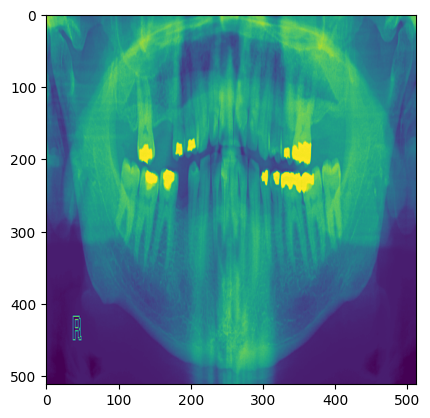

In [ ]:
plt.imshow(x_train[random_number,:,:,0])

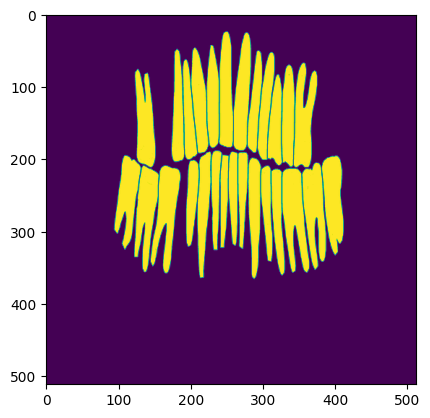

In [ ]:
plt.imshow(y_train[random_number,:,:,0])

In [ ]:
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, BatchNormalization, concatenate, Conv2DTranspose, Dropout
from tensorflow.keras.models import Model

def UNET(input_shape=(512, 512, 1), last_activation='sigmoid'):
    inputs = Input(shape=input_shape)

    conv1 = Conv2D(32, (3, 3), activation='relu', padding='same', kernel_initializer='he_normal')(inputs)
    d1 = Dropout(0.1)(conv1)
    conv2 = Conv2D(32, (3, 3), activation='relu', padding='same', kernel_initializer='he_normal')(d1)
    b = BatchNormalization()(conv2)

    pool1 = MaxPooling2D(pool_size=(2, 2))(b)
    conv3 = Conv2D(64, (3, 3), activation='relu', padding='same', kernel_initializer='he_normal')(pool1)
    d2 = Dropout(0.2)(conv3)
    conv4 = Conv2D(64, (3, 3), activation='relu', padding='same', kernel_initializer='he_normal')(d2)
    b1 = BatchNormalization()(conv4)

    pool2 = MaxPooling2D(pool_size=(2, 2))(b1)
    conv5 = Conv2D(128, (3, 3), activation='relu', padding='same', kernel_initializer='he_normal')(pool2)
    d3 = Dropout(0.3)(conv5)
    conv6 = Conv2D(128, (3, 3), activation='relu', padding='same', kernel_initializer='he_normal')(d3)
    b2 = BatchNormalization()(conv6)

    pool3 = MaxPooling2D(pool_size=(2, 2))(b2)
    conv7 = Conv2D(256, (3, 3), activation='relu', padding='same', kernel_initializer='he_normal')(pool3)
    d4 = Dropout(0.4)(conv7)
    conv8 = Conv2D(256, (3, 3), activation='relu', padding='same', kernel_initializer='he_normal')(d4)
    b3 = BatchNormalization()(conv8)

    pool4 = MaxPooling2D(pool_size=(2, 2))(b3)
    conv9 = Conv2D(512, (3, 3), activation='relu', padding='same', kernel_initializer='he_normal')(pool4)
    d5 = Dropout(0.5)(conv9)
    conv10 = Conv2D(512, (3, 3), activation='relu', padding='same', kernel_initializer='he_normal')(d5)
    b4 = BatchNormalization()(conv10)

    conv11 = Conv2DTranspose(512, (4, 4), activation='relu', padding='same', strides=(2, 2), kernel_initializer='he_normal')(b4)
    x = concatenate([conv11, conv8])
    conv12 = Conv2D(256, (3, 3), activation='relu', padding='same', kernel_initializer='he_normal')(x)
    d6 = Dropout(0.4)(conv12)
    conv13 = Conv2D(256, (3, 3), activation='relu', padding='same', kernel_initializer='he_normal')(d6)
    b5 = BatchNormalization()(conv13)

    conv14 = Conv2DTranspose(256, (4, 4), activation='relu', padding='same', strides=(2, 2), kernel_initializer='he_normal')(b5)
    x1 = concatenate([conv14, conv6])
    conv15 = Conv2D(128, 3, activation='relu', padding='same', kernel_initializer='he_normal')(x1)
    d7 = Dropout(0.3)(conv15)
    conv16 = Conv2D(128, 3, activation='relu', padding='same', kernel_initializer='he_normal')(d7)
    b6 = BatchNormalization()(conv16)

    conv17 = Conv2DTranspose(128, (4, 4), activation='relu', padding='same', strides=(2, 2), kernel_initializer='he_normal')(b6)
    x2 = concatenate([conv17, conv4])
    conv18 = Conv2D(64, (3, 3), activation='relu', padding='same', kernel_initializer='he_normal')(x2)
    d8 = Dropout(0.2)(conv18)
    conv19 = Conv2D(64, (3, 3), activation='relu', padding='same', kernel_initializer='he_normal')(d8)
    b7 = BatchNormalization()(conv19)

    conv20 = Conv2DTranspose(64, (4, 4), activation='relu', padding='same', strides=(2, 2), kernel_initializer='he_normal')(b7)
    x3 = concatenate([conv20, conv2])
    conv21 = Conv2D(32, (3, 3), activation='relu', padding='same', kernel_initializer='he_normal')(x3)
    d9 = Dropout(0.1)(conv21)
    conv22 = Conv2D(32, (3, 3), activation='relu', padding='same', kernel_initializer='he_normal')(d9)

    outputs = Conv2D(1, (1, 1), activation=last_activation, padding='same', kernel_initializer='he_normal')(conv22)
    model2 = Model( inputs = inputs, outputs = outputs)

    return model2


In [ ]:
model=UNET(input_shape=(512,512,1),last_activation='sigmoid')
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 512, 512, 1  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 512, 512, 32  320         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 dropout (Dropout)              (None, 512, 512, 32  0           ['conv2d[0][0]']                 
                                )                                                             

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Define callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
model_checkpoint = ModelCheckpoint('UNET_Dental_model.h5', monitor='val_loss', save_best_only=True)

# Train the model with callbacks
history = model.fit(x_train, y_train, batch_size=8, epochs=200, verbose=1, validation_data=(x_test, y_test),
                    callbacks=[early_stopping, model_checkpoint])

Epoch 1/200
66/66 [==============================] - 153s 2s/step - loss: 0.3401 - accuracy: 0.7999 - val_loss: 1.0702 - val_accuracy: 0.6456
Epoch 2/200
66/66 [==============================] - 81s 1s/step - loss: 0.2299 - accuracy: 0.8560 - val_loss: 0.7544 - val_accuracy: 0.7911
Epoch 3/200
66/66 [==============================] - 80s 1s/step - loss: 0.1997 - accuracy: 0.8666 - val_loss: 1.0035 - val_accuracy: 0.7599
Epoch 4/200
66/66 [==============================] - 80s 1s/step - loss: 0.1862 - accuracy: 0.8722 - val_loss: 0.7675 - val_accuracy: 0.7766
Epoch 5/200
66/66 [==============================] - 81s 1s/step - loss: 0.1795 - accuracy: 0.8744 - val_loss: 0.2385 - val_accuracy: 0.8632
Epoch 6/200
66/66 [==============================] - 81s 1s/step - loss: 0.1677 - accuracy: 0.8795 - val_loss: 0.2373 - val_accuracy: 0.8621
Epoch 7/200
66/66 [==============================] - 81s 1s/step - loss: 0.1582 - accuracy: 0.8837 - val_loss: 0.1911 - val_accuracy: 0.8693
Epoch 8/200


In [ ]:
model.save("dental_pred_model_Unet.h5")

In [ ]:
!gdown 1IU-Tl3rXycbHqYGh_tLb8_6l-t_U73Sm

Downloading...
From (uriginal): https://drive.google.com/uc?id=1IU-Tl3rXycbHqYGh_tLb8_6l-t_U73Sm
From (redirected): https://drive.google.com/uc?id=1IU-Tl3rXycbHqYGh_tLb8_6l-t_U73Sm&confirm=t&uuid=d0139984-2c0d-4f07-80ff-6d5af44c0771
To: /content/dental_pred_model_Unet.h5
100% 161M/161M [00:02<00:00, 69.3MB/s]


In [ ]:
from tensorflow.keras.models import load_model
model_path = '/content/dental_pred_model_Unet.h5'
model = load_model(model_path)

In [ ]:
predict_img=model.predict(x_test)
predict=predict_img[4,:,:,0]

1/1 [==============================] - 11s 11s/step


In [ ]:
from sklearn.metrics import f1_score
import numpy as np
predict_img1=(predict_img>0.25)*1
y_test1=(y_test>0.25)*1

f1_score(predict_img1.flatten(), y_test1.flatten(), average='micro')

0.9561725963245739

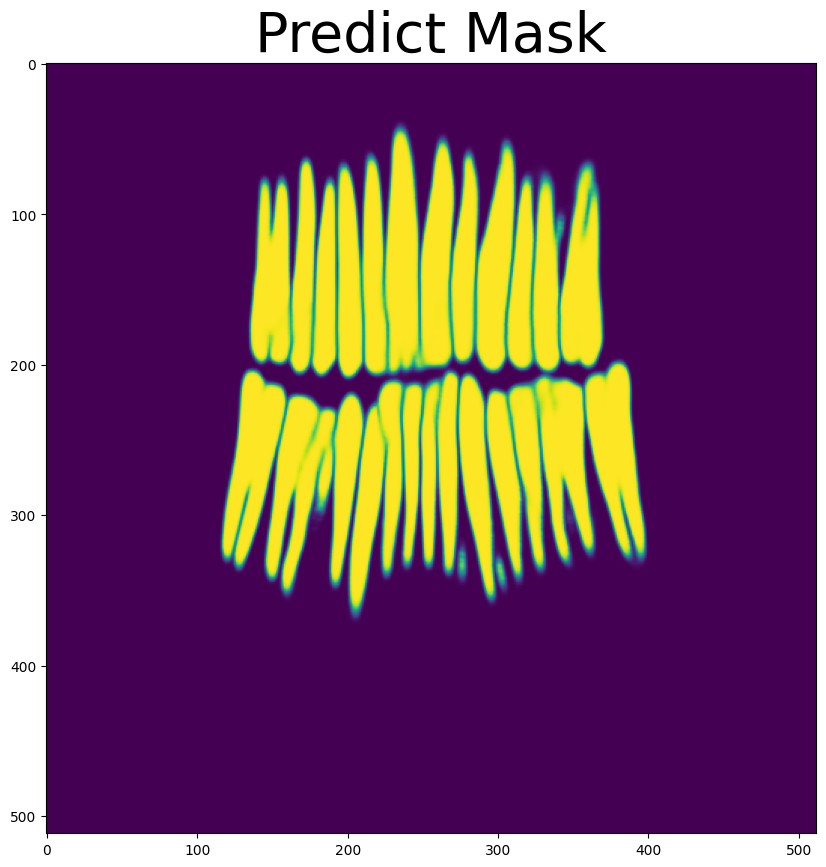

In [ ]:
plt.figure(figsize = (20,10))
plt.title("Predict Mask",fontsize = 40)
plt.imshow(predict)
#For CCA, we saved
plt.imsave("/content/predict.png",predict)

In [ ]:
import cv2
import numpy as np
from imutils import perspective
from scipy.spatial import distance as dist

def midpoint(ptA, ptB):
    return ((ptA[0] + ptB[0]) * 0.5, (ptA[1] + ptB[1]) * 0.5)

def prediction_teeth_angle(orig_image, predict_image, erode_iteration, open_iteration):
    kernel1 = np.ones((5, 5), dtype=np.float32)
    kernel_sharpening = np.array([[-1, -1, -1],
                                  [-1, 9, -1],
                                  [-1, -1, -1]])
    image = predict_image
    image2 = orig_image
    image = cv2.morphologyEx(image, cv2.MORPH_OPEN, kernel1, iterations=open_iteration)
    image = cv2.filter2D(image, -1, kernel_sharpening)
    image = cv2.erode(image, kernel1, iterations=erode_iteration)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    thresh = cv2.threshold(image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]
    labels = cv2.connectedComponents(thresh, connectivity=8)[1]
    a = np.unique(labels)
    count2 = 0

    # Create a horizontal line for angle reference
    h, w = orig_image.shape[:2]
    line_y = h // 2  # Choose the y-coordinate of the line as per your image
    cv2.line(image2, (0, line_y), (w, line_y), (0, 255, 0), 2)

    for label in a:
        if label == 0:
            continue

        # Create a mask
        mask = np.zeros(thresh.shape, dtype="uint8")
        mask[labels == label] = 255
        cnts, hieararch = cv2.findContours(mask.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        cnts = cnts[0]
        c_area = cv2.contourArea(cnts)
        if c_area > 2000:
            count2 += 1

        (x, y), radius = cv2.minEnclosingCircle(cnts)
        rect = cv2.minAreaRect(cnts)
        box = cv2.boxPoints(rect)
        box = np.array(box, dtype="int")
        box = perspective.order_points(box)
        color1 = list(np.random.choice(range(150), size=3))
        color = [int(color1[0]), int(color1[1]), int(color1[2])]
        cv2.drawContours(image2, [box.astype("int")], 0, color, 2)
        (tl, tr, br, bl) = box

        (tltrX, tltrY) = midpoint(tl, tr)
        (blbrX, blbrY) = midpoint(bl, br)
        (tlblX, tlblY) = midpoint(tl, bl)
        (trbrX, trbrY) = midpoint(tr, br)

        cv2.circle(image2, (int(tltrX), int(tltrY)), 5, (255, 0, 0), -1)
        cv2.circle(image2, (int(blbrX), int(blbrY)), 5, (255, 0, 0), -1)
        cv2.circle(image2, (int(tlblX), int(tlblY)), 5, (255, 0, 0), -1)
        cv2.circle(image2, (int(trbrX), int(trbrY)), 5, (255, 0, 0), -1)
        cv2.line(image2, (int(tltrX), int(tltrY)), (int(blbrX), int(blbrY)), color, 2)
        cv2.line(image2, (int(tlblX), int(tlblY)), (int(trbrX), int(trbrY)), color, 2)
        # Calculate angle with respect to the horizontal line
        angle_rad = np.arctan2(tltrY - blbrY, tltrX - blbrX)
        angle_deg = np.degrees(angle_rad)
        #print(angle_deg)
        if angle_deg < 0:
          angle_diff = angle_deg + 90
        else:
          angle_diff = angle_deg - 90
        dA = dist.euclidean((tltrX, tltrY), (blbrX, blbrY))
        dB = dist.euclidean((tlblX, tlblY), (trbrX, trbrY))
        pixelsPerMetric = 1
        dimA = dA * pixelsPerMetric
        dimB = dB * pixelsPerMetric
        cv2.putText(image2, "{:.1f} deg".format(angle_diff), (int(tltrX), int(tltrY - 30)), cv2.FONT_HERSHEY_SIMPLEX,0.65, color, 2)
        cv2.putText(image2, "{:.1f}".format(label), (int(tltrX - 35), int(tltrY - 5)), cv2.FONT_HERSHEY_SIMPLEX, 0.65,color, 2)
        print("Tooth {}: {:.1f} deg".format(label, angle_diff))
    teeth_count = count2
    return image2, teeth_count



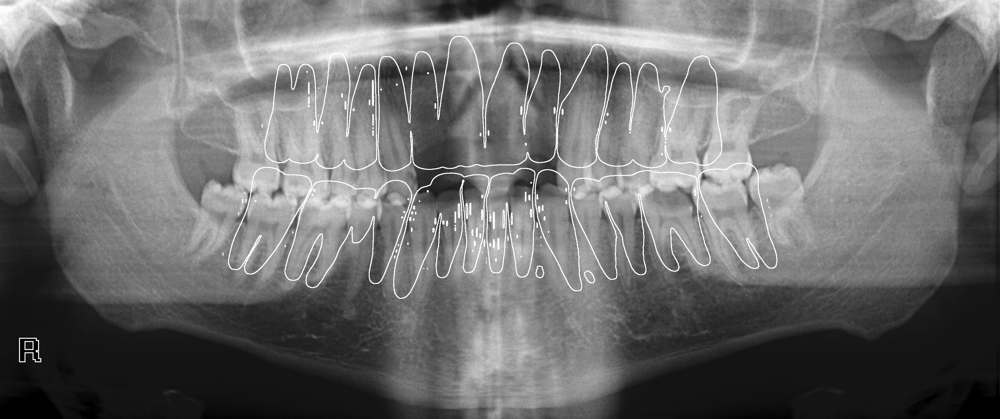

In [ ]:
from google.colab.patches import cv2_imshow
import cv2


##Plotting - RESULT Example
img=cv2.imread("/content/dataset/Images/1.png")#original img 107.png

predict1 = cv2.resize(predict, (img.shape[1],img.shape[0]), interpolation=cv2.INTER_LANCZOS4)
mask = np.uint8(predict1 * 255)
_, mask = cv2.threshold(mask, thresh=255/2, maxval=255, type=cv2.THRESH_BINARY)
cnts, hierarchy = cv2.findContours(mask, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
img_umat = cv2.UMat(img)
cv2.drawContours(img_umat, cnts, -1, (255, 255, 255), 2)
img = cv2.UMat.get(img_umat)
cv2_imshow(img)

Tooth 1: 2.1 deg
Tooth 2: 9.0 deg
Tooth 3: 4.0 deg
Tooth 4: -3.9 deg
Tooth 5: 4.4 deg
Tooth 6: 0.0 deg
Tooth 7: -2.9 deg
Tooth 8: 1.5 deg
Tooth 9: -2.1 deg
Tooth 10: 0.0 deg
Tooth 11: 6.1 deg
Tooth 12: -12.8 deg
Tooth 13: 17.6 deg
Tooth 14: 0.6 deg
Tooth 15: -8.7 deg
Tooth 16: -9.8 deg
Tooth 17: 15.0 deg
Tooth 18: 5.5 deg
Tooth 19: 5.7 deg
Tooth 20: 70.5 deg
Tooth 21: -71.8 deg
Tooth 22: 15.4 deg
Tooth 23: 0.0 deg
Tooth 24: 50.2 deg


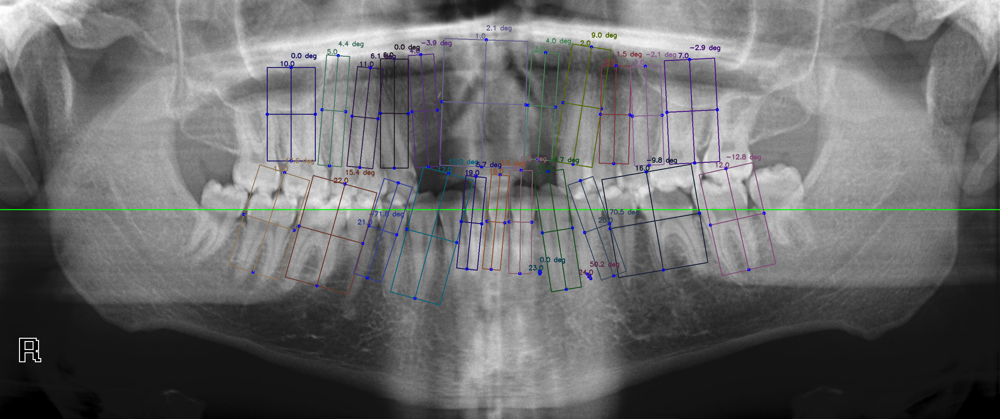

In [ ]:
from google.colab.patches import cv2_imshow
import cv2

img=cv2.imread("/content/dataset/Images/1.png")
predicted=cv2.imread("/content/predict.png")

predicted = cv2.resize(predicted, (img.shape[1],img.shape[0]), interpolation=cv2.INTER_LANCZOS4)

angle_result,teeth_count=prediction_teeth_angle(img,predicted,3,2)
cv2_imshow(angle_result)

# **Prediction on Test images**


In [ ]:
!pip install -U --no-cache-dir gdown --pre

In [ ]:
!gdown 1IU-Tl3rXycbHqYGh_tLb8_6l-t_U73Sm

Downloading...
From (uriginal): https://drive.google.com/uc?id=1IU-Tl3rXycbHqYGh_tLb8_6l-t_U73Sm
From (redirected): https://drive.google.com/uc?id=1IU-Tl3rXycbHqYGh_tLb8_6l-t_U73Sm&confirm=t&uuid=fdf0cbfa-0385-4f95-ad12-b5cd8e539f65
To: /content/dental_pred_model_Unet.h5
100% 161M/161M [00:00<00:00, 211MB/s]


In [ ]:
from tensorflow.keras.models import load_model
model_path = '/content/dental_pred_model_Unet.h5'
model = load_model(model_path)

In [ ]:
import cv2
import numpy as np
from imutils import perspective
from scipy.spatial import distance as dist

def midpoint(ptA, ptB):
    return ((ptA[0] + ptB[0]) * 0.5, (ptA[1] + ptB[1]) * 0.5)

def prediction_teeth_angle(orig_image, predict_image, erode_iteration, open_iteration):
    kernel1 = np.ones((5, 5), dtype=np.float32)
    kernel_sharpening = np.array([[-1, -1, -1],
                                  [-1, 9, -1],
                                  [-1, -1, -1]])
    image = predict_image
    image2 = orig_image
    image = cv2.morphologyEx(image, cv2.MORPH_OPEN, kernel1, iterations=open_iteration)
    image = cv2.filter2D(image, -1, kernel_sharpening)
    image = cv2.erode(image, kernel1, iterations=erode_iteration)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    thresh = cv2.threshold(image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]
    labels = cv2.connectedComponents(thresh, connectivity=8)[1]
    a = np.unique(labels)
    count2 = 0

    # Create a horizontal line for angle reference
    h, w = orig_image.shape[:2]
    line_y = h // 2  # Choose the y-coordinate of the line as per image
    cv2.line(image2, (0, line_y), (w, line_y), (0, 255, 0), 2)

    for label in a:
        if label == 0:
            continue

        # Create a mask
        mask = np.zeros(thresh.shape, dtype="uint8")
        mask[labels == label] = 255
        cnts, hieararch = cv2.findContours(mask.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        cnts = cnts[0]
        c_area = cv2.contourArea(cnts)
        if c_area > 2000:
            count2 += 1

        (x, y), radius = cv2.minEnclosingCircle(cnts)
        rect = cv2.minAreaRect(cnts)
        box = cv2.boxPoints(rect)
        box = np.array(box, dtype="int")
        box = perspective.order_points(box)
        color1 = list(np.random.choice(range(150), size=3))
        color = [int(color1[0]), int(color1[1]), int(color1[2])]
        cv2.drawContours(image2, [box.astype("int")], 0, color, 2)
        (tl, tr, br, bl) = box

        (tltrX, tltrY) = midpoint(tl, tr)
        (blbrX, blbrY) = midpoint(bl, br)
        (tlblX, tlblY) = midpoint(tl, bl)
        (trbrX, trbrY) = midpoint(tr, br)

        cv2.circle(image2, (int(tltrX), int(tltrY)), 5, (255, 0, 0), -1)
        cv2.circle(image2, (int(blbrX), int(blbrY)), 5, (255, 0, 0), -1)
        cv2.circle(image2, (int(tlblX), int(tlblY)), 5, (255, 0, 0), -1)
        cv2.circle(image2, (int(trbrX), int(trbrY)), 5, (255, 0, 0), -1)
        cv2.line(image2, (int(tltrX), int(tltrY)), (int(blbrX), int(blbrY)), color, 2)
        cv2.line(image2, (int(tlblX), int(tlblY)), (int(trbrX), int(trbrY)), color, 2)
        # Calculate angle with respect to the horizontal line
        angle_rad = np.arctan2(tltrY - blbrY, tltrX - blbrX)
        angle_deg = np.degrees(angle_rad)
        #print(angle_deg)
        if angle_deg < 0:
          angle_diff = angle_deg + 90
        else:
          angle_diff = angle_deg - 90
        #print(angle_diff)
        dA = dist.euclidean((tltrX, tltrY), (blbrX, blbrY))
        dB = dist.euclidean((tlblX, tlblY), (trbrX, trbrY))
        pixelsPerMetric = 1
        dimA = dA * pixelsPerMetric
        dimB = dB * pixelsPerMetric
        #cv2.putText(image2, "{:.1f} pixel".format(dimA), (int(tltrX - 15), int(tltrY - 10)), cv2.FONT_HERSHEY_SIMPLEX,0.65, color, 2)
        #cv2.putText(image2, "{:.1f} pixel".format(dimB), (int(trbrX + 10), int(trbrY)), cv2.FONT_HERSHEY_SIMPLEX,0.65, color, 2)
        cv2.putText(image2, "{:.1f} deg".format(angle_diff), (int(tltrX), int(tltrY - 30)), cv2.FONT_HERSHEY_SIMPLEX,0.65, color, 2)
        cv2.putText(image2, "{:.1f}".format(label), (int(tltrX - 35), int(tltrY - 5)), cv2.FONT_HERSHEY_SIMPLEX, 0.65,color, 2)
        print("Tooth {}: {:.1f} deg".format(label, angle_diff))
    teeth_count = count2
    #print(teeth_count)
    return image2, teeth_count



1/1 [==============================] - 0s 24ms/step


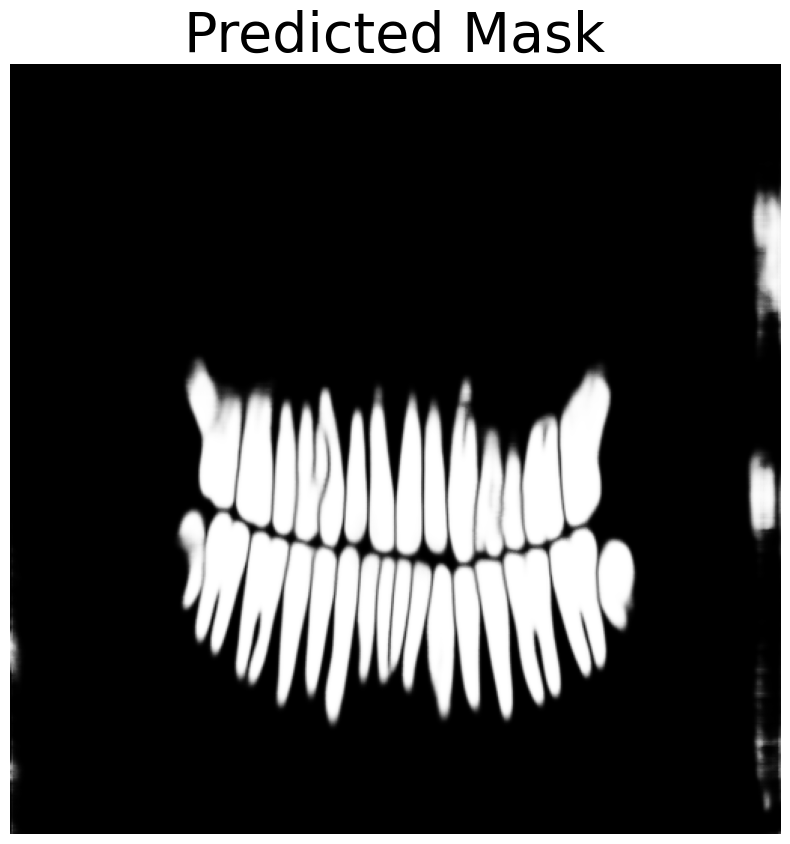

In [ ]:
import os
import numpy as np
from PIL import Image
from tensorflow.keras.preprocessing.image import img_to_array, load_img
import matplotlib.pyplot as plt

def process_input_image(image_path):
    img = load_img(image_path, grayscale=True, target_size=(512, 512))
    img = img_to_array(img) / 255.0
    img = np.expand_dims(img, axis=0)
    return img

# Example usage
input_image_path = 'Test7.jpeg' #change the image here
input_image = process_input_image(input_image_path)
predict = model.predict(input_image)
predict = np.squeeze(predict, axis=0)

plt.figure(figsize=(20, 10))
plt.title("Predicted Mask", fontsize=40)
plt.imshow(predict, cmap='gray')
plt.axis('off')
plt.show()

from PIL import Image

# Reshape and convert the predicted mask
predict = predict.squeeze()
predict = (predict * 255).astype(np.uint8)

# Save the predicted mask as an image
output_image_path = "predict1.png"
output_image = Image.fromarray(predict, mode='L')  # Convert the array to a PIL Image
output_image.save(output_image_path)


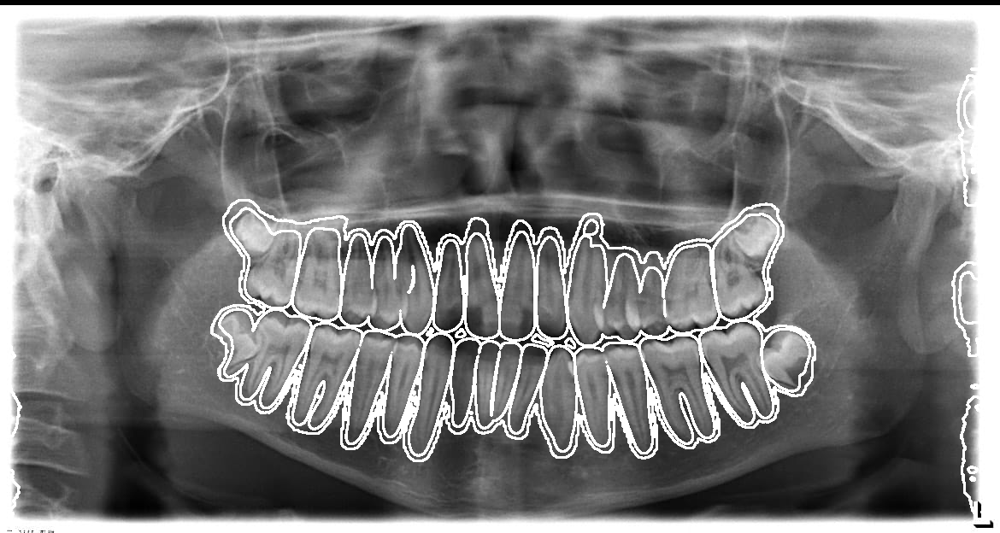

In [ ]:
from google.colab.patches import cv2_imshow
import cv2
img=cv2.imread("Test7.jpeg")##change the image here

predict1 = cv2.resize(predict, (img.shape[1],img.shape[0]), interpolation=cv2.INTER_LANCZOS4)
mask = np.uint8(predict1 * 255)
_, mask = cv2.threshold(mask, thresh=255/2, maxval=255, type=cv2.THRESH_BINARY)
cnts, hierarchy = cv2.findContours(mask, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
img_umat = cv2.UMat(img)
cv2.drawContours(img_umat, cnts, -1, (255, 255, 255), 2)
img = cv2.UMat.get(img_umat)
cv2_imshow(img)

Tooth 1: 0.0 deg
Tooth 2: -13.5 deg
Tooth 3: 10.6 deg
Tooth 4: -1.6 deg
Tooth 5: 9.4 deg
Tooth 6: 0.0 deg
Tooth 7: 5.7 deg
Tooth 8: 0.0 deg
Tooth 9: 3.7 deg
Tooth 10: -4.2 deg
Tooth 11: 4.5 deg
Tooth 12: -90.0 deg
Tooth 13: 5.6 deg
Tooth 14: -6.6 deg
Tooth 15: 0.0 deg
Tooth 16: -4.0 deg
Tooth 17: -3.5 deg
Tooth 18: 20.7 deg
Tooth 19: -15.9 deg
Tooth 20: 20.4 deg
Tooth 21: 18.8 deg
Tooth 22: -71.6 deg
Tooth 23: 9.5 deg
Tooth 24: -79.6 deg
Tooth 25: -13.2 deg
Tooth 26: 6.9 deg
Tooth 27: -83.7 deg
Tooth 28: -77.5 deg
Tooth 29: 73.4 deg
Tooth 30: -75.5 deg
Tooth 31: 0.0 deg
Tooth 32: -12.3 deg
Tooth 33: -90.0 deg


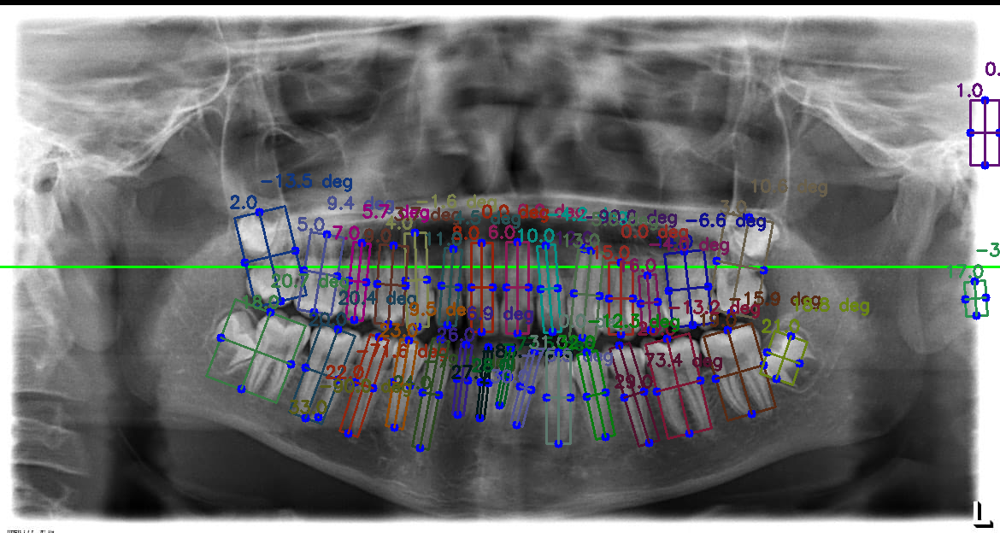

In [ ]:
from google.colab.patches import cv2_imshow
import cv2

img=cv2.imread("Test7.jpeg")#change the image here
predicted=cv2.imread("/content/predict1.png")

predicted = cv2.resize(predicted, (img.shape[1],img.shape[0]), interpolation=cv2.INTER_LANCZOS4)

angle_result,teeth_count=prediction_teeth_angle(img,predicted,3,2)
cv2_imshow(angle_result)

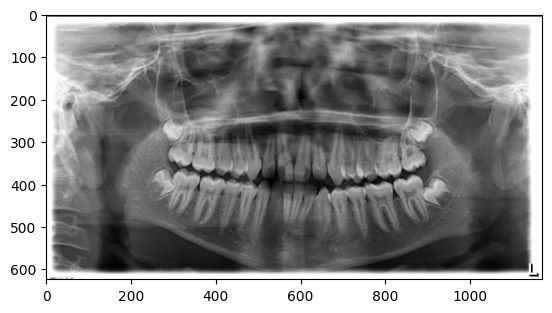

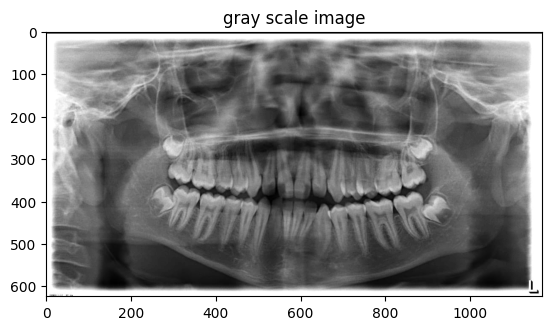

In [ ]:
#converting to grayscale image
#importing required modules
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

#function using np.dot()
def rgb2gray(rgb):
    return np.dot(rgb[...,:3], [0.299, 0.587, 0.144])
#read the original image
img_rgb = mpimg.imread('xray_1.jpeg')
plt.imshow(img_rgb)
#display the original image
plt.show()

#converting the image to monochrome
plt.title("gray scale image")
img_gray = rgb2gray(img_rgb)
plt.imshow(img_gray, cmap=plt.get_cmap('gray'))
plt.savefig('resulteeth1.jpg')
#display the black and white image

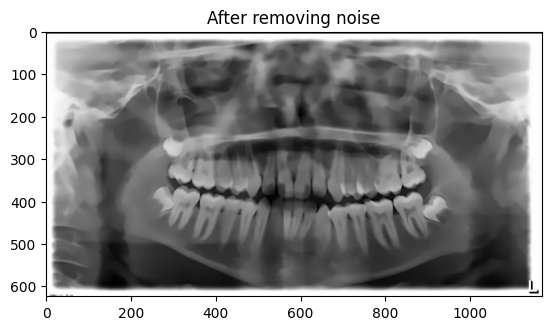

In [ ]:
import numpy as np
import cv2
from matplotlib import pyplot as plt
from matplotlib import image as mpimg
try:
  img = cv2.imread('xray_1.jpeg')

  dst = cv2.fastNlMeansDenoisingColored(img,None,10,10,7,21)

#plt.subplot(121),plt.imshow(img)
#plt.subplot(122),plt.imshow(dst)
  cv2.imwrite('noiseresult1.jpg',dst)
except IOError:
  print('error')


plt.title("After removing noise")
image=mpimg.imread("noiseresult1.jpg")
plt.imshow(image)
plt.show()

1/1 [==============================] - 0s 23ms/step


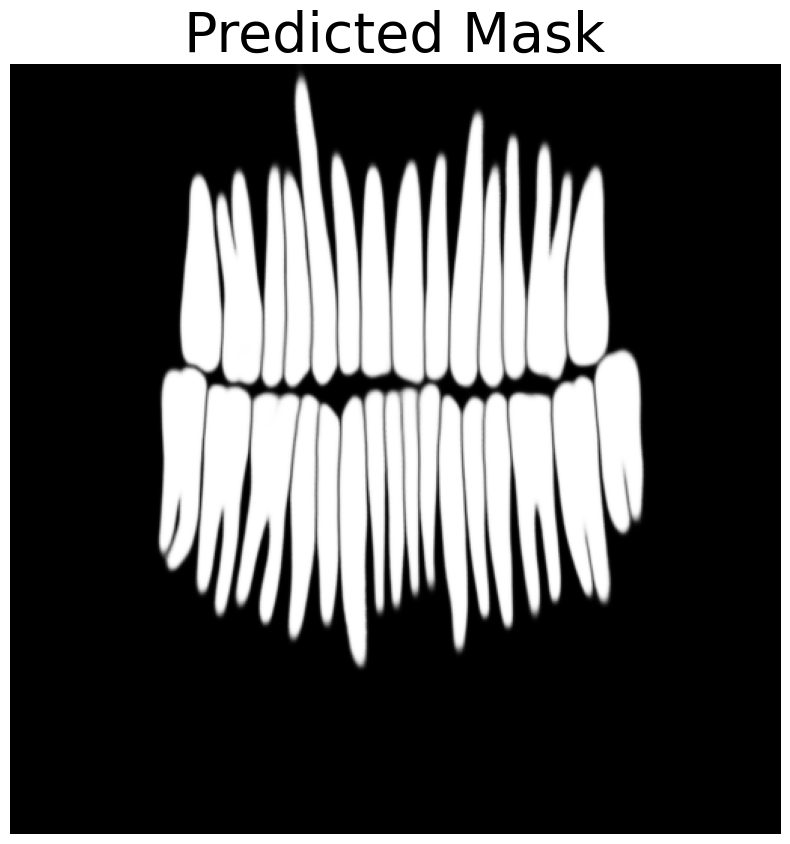

In [ ]:
import os
import numpy as np
from PIL import Image
from tensorflow.keras.preprocessing.image import img_to_array, load_img
import matplotlib.pyplot as plt

def process_input_image(image_path):
    img = load_img(image_path, grayscale=True, target_size=(512, 512))
    img = img_to_array(img) / 255.0
    img = np.expand_dims(img, axis=0)
    return img

# Example usage
input_image_path = 'test.png'
input_image = process_input_image(input_image_path)
predict = model.predict(input_image)
predict = np.squeeze(predict, axis=0)

plt.figure(figsize=(20, 10))
plt.title("Predicted Mask", fontsize=40)
plt.imshow(predict, cmap='gray')
plt.axis('off')
plt.show()

from PIL import Image

# Reshape and convert the predicted mask
predict = predict.squeeze()
predict = (predict * 255).astype(np.uint8)

# Save the predicted mask as an image
output_image_path = "predict1.png"
output_image = Image.fromarray(predict, mode='L')  # Convert the array to a PIL Image
output_image.save(output_image_path)


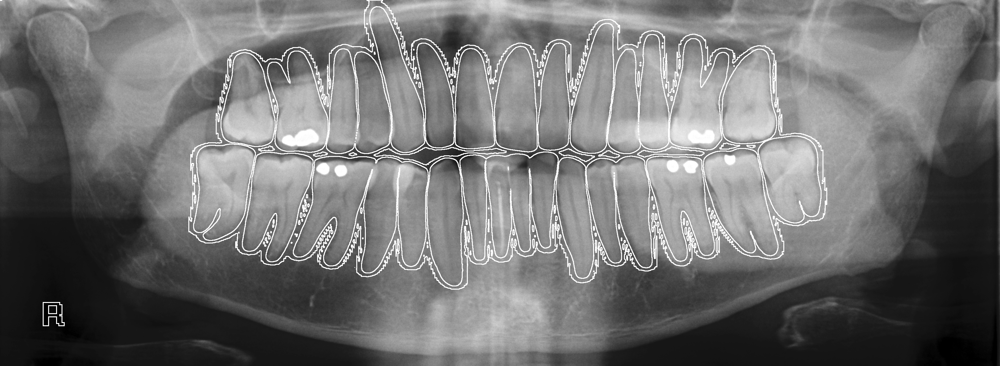

In [ ]:
from google.colab.patches import cv2_imshow
import cv2
img=cv2.imread("test.png")

predict1 = cv2.resize(predict, (img.shape[1],img.shape[0]), interpolation=cv2.INTER_LANCZOS4)
mask = np.uint8(predict1 * 255)
_, mask = cv2.threshold(mask, thresh=255/2, maxval=255, type=cv2.THRESH_BINARY)
cnts, hierarchy = cv2.findContours(mask, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
img_umat = cv2.UMat(img)
cv2.drawContours(img_umat, cnts, -1, (255, 255, 255), 2)
img = cv2.UMat.get(img_umat)
cv2_imshow(img)

Tooth 1: -9.9 deg
Tooth 2: 6.9 deg
Tooth 3: 0.7 deg
Tooth 4: 5.2 deg
Tooth 5: -6.3 deg
Tooth 6: 3.9 deg
Tooth 7: -0.7 deg
Tooth 8: -2.1 deg
Tooth 9: 5.3 deg
Tooth 10: -2.8 deg
Tooth 11: -6.6 deg
Tooth 12: -6.3 deg
Tooth 13: -0.8 deg
Tooth 14: 10.6 deg
Tooth 15: -12.3 deg
Tooth 16: 10.0 deg
Tooth 17: -12.8 deg
Tooth 18: 11.9 deg
Tooth 19: 4.9 deg
Tooth 20: -4.1 deg
Tooth 21: -2.0 deg
Tooth 22: 15.5 deg
Tooth 23: -7.0 deg
Tooth 24: -12.0 deg
Tooth 25: 2.1 deg
Tooth 26: -5.9 deg
Tooth 27: -1.5 deg
Tooth 28: -4.0 deg


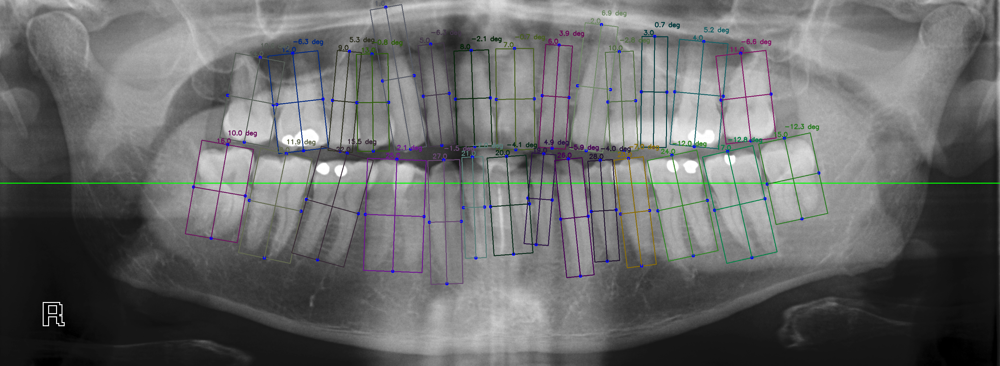

In [ ]:
from google.colab.patches import cv2_imshow
import cv2

img=cv2.imread("test.png")
predicted=cv2.imread("/content/predict1.png")

predicted = cv2.resize(predicted, (img.shape[1],img.shape[0]), interpolation=cv2.INTER_LANCZOS4)

angle_result,teeth_count=prediction_teeth_angle(img,predicted,3,2)
cv2_imshow(angle_result)

/usr/local/lib/python3.10/dist-packages/keras/utils/image_utils.py:409: UserWarning: grayscale is deprecated. Please use color_mode = "grayscale"
  warnings.warn(


1/1 [==============================] - 2s 2s/step


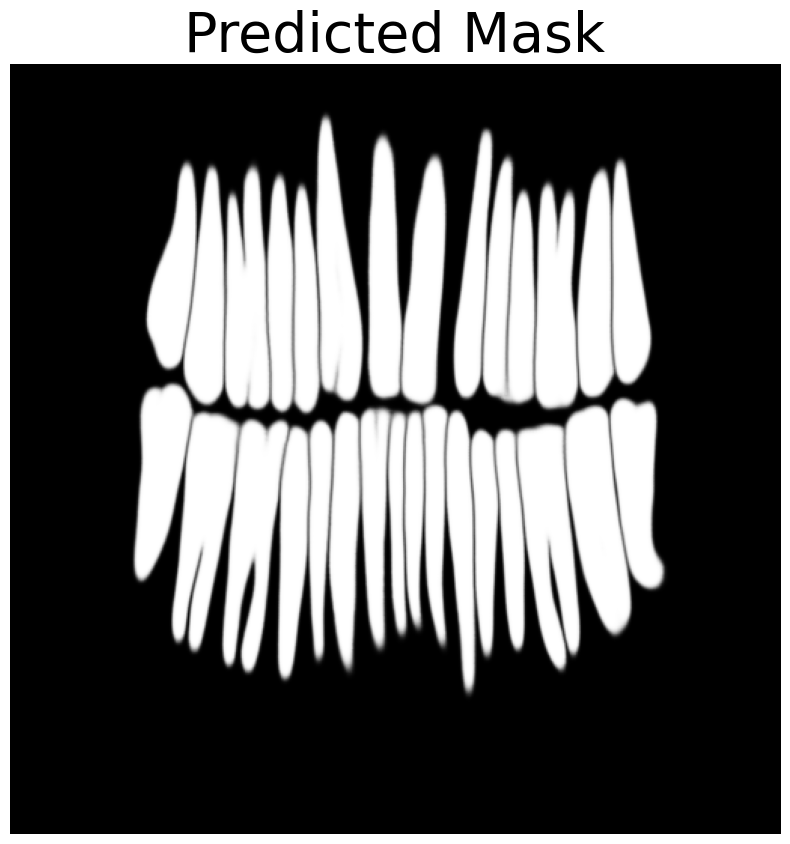

In [ ]:
#we are doing
import os
import numpy as np
from PIL import Image
from tensorflow.keras.preprocessing.image import img_to_array, load_img
import matplotlib.pyplot as plt

def process_input_image(image_path):
    img = load_img(image_path, grayscale=True, target_size=(512, 512))
    img = img_to_array(img) / 255.0
    img = np.expand_dims(img, axis=0)
    return img

# Example usage
input_image_path = 'xray.jpg' #change the image here
input_image = process_input_image(input_image_path)
predict = model.predict(input_image)
predict = np.squeeze(predict, axis=0)

plt.figure(figsize=(20, 10))
plt.title("Predicted Mask", fontsize=40)
plt.imshow(predict, cmap='gray')
plt.axis('off')
plt.show()

from PIL import Image

# Reshape and convert the predicted mask
predict = predict.squeeze()
predict = (predict * 255).astype(np.uint8)

# Save the predicted mask as an image
output_image_path = "new_predict.png"
output_image = Image.fromarray(predict, mode='L')  # Convert the array to a PIL Image
output_image.save(output_image_path)


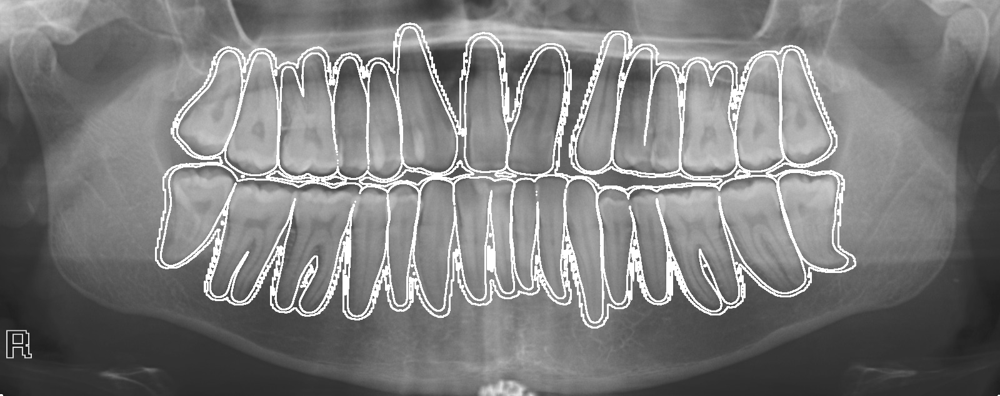

In [ ]:
from google.colab.patches import cv2_imshow
import cv2
img=cv2.imread("xray.jpg")

predict1 = cv2.resize(predict, (img.shape[1],img.shape[0]), interpolation=cv2.INTER_LANCZOS4)
mask = np.uint8(predict1 * 255)
_, mask = cv2.threshold(mask, thresh=255/2, maxval=255, type=cv2.THRESH_BINARY)
cnts, hierarchy = cv2.findContours(mask, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
img_umat = cv2.UMat(img)
cv2.drawContours(img_umat, cnts, -1, (255, 255, 255), 2)
img = cv2.UMat.get(img_umat)
cv2_imshow(img)

Tooth 1: -4.4 deg
Tooth 2: 7.4 deg
Tooth 3: 0.0 deg
Tooth 4: 9.5 deg
Tooth 5: 3.1 deg
Tooth 6: 69.1 deg
Tooth 7: -60.9 deg
Tooth 8: 16.9 deg
Tooth 9: -5.6 deg
Tooth 10: -2.0 deg
Tooth 11: -0.5 deg
Tooth 12: 0.0 deg
Tooth 13: -2.3 deg
Tooth 14: 23.6 deg
Tooth 15: -6.0 deg
Tooth 16: 0.8 deg
Tooth 17: -17.9 deg
Tooth 18: 3.3 deg
Tooth 19: 14.8 deg
Tooth 20: 6.5 deg
Tooth 21: -0.9 deg
Tooth 22: 1.4 deg
Tooth 23: -7.0 deg
Tooth 24: 17.4 deg
Tooth 25: 0.9 deg
Tooth 26: -12.1 deg
Tooth 27: 5.9 deg
Tooth 28: -9.9 deg
Tooth 29: -5.2 deg


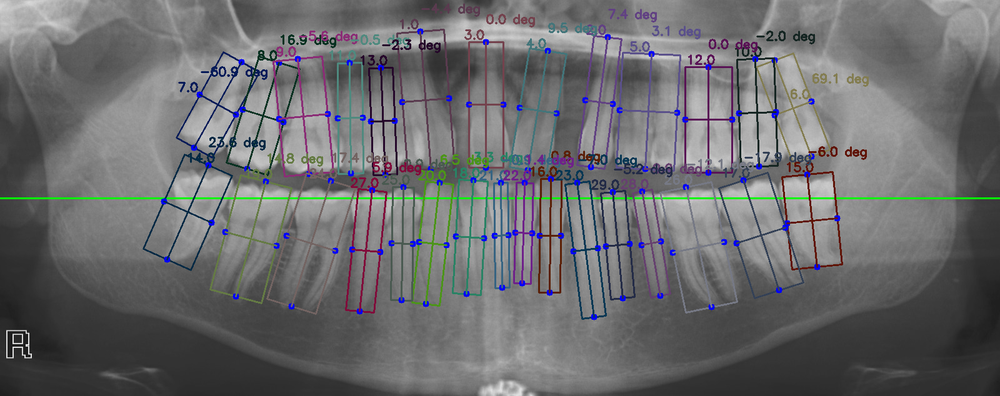

In [ ]:
from google.colab.patches import cv2_imshow
import cv2

img=cv2.imread("xray.jpg")
predicted=cv2.imread("/content/new_predict.png")

predicted = cv2.resize(predicted, (img.shape[1],img.shape[0]), interpolation=cv2.INTER_LANCZOS4)

angle_result,teeth_count=prediction_teeth_angle(img,predicted,3,2)
cv2_imshow(angle_result)